# `Classic CV`

___
<a id=100>Содержание</a>
- [Загрузка изображений](#1)
    - PIL
    - cv2
    - torchvision
    - skimage
- [Изменение фона](#2)
- [Гистограммы](#3)
- [Поиск границ](#4)
- [билатеральный фильтр](#5)
- [skimage](#4)

    

___
## <center><a id=1>Загрузка изображений</a>

### <center><a>PIL</a>

<class 'PIL.JpegImagePlugin.JpegImageFile'> JPEG (1920, 1279) RGB


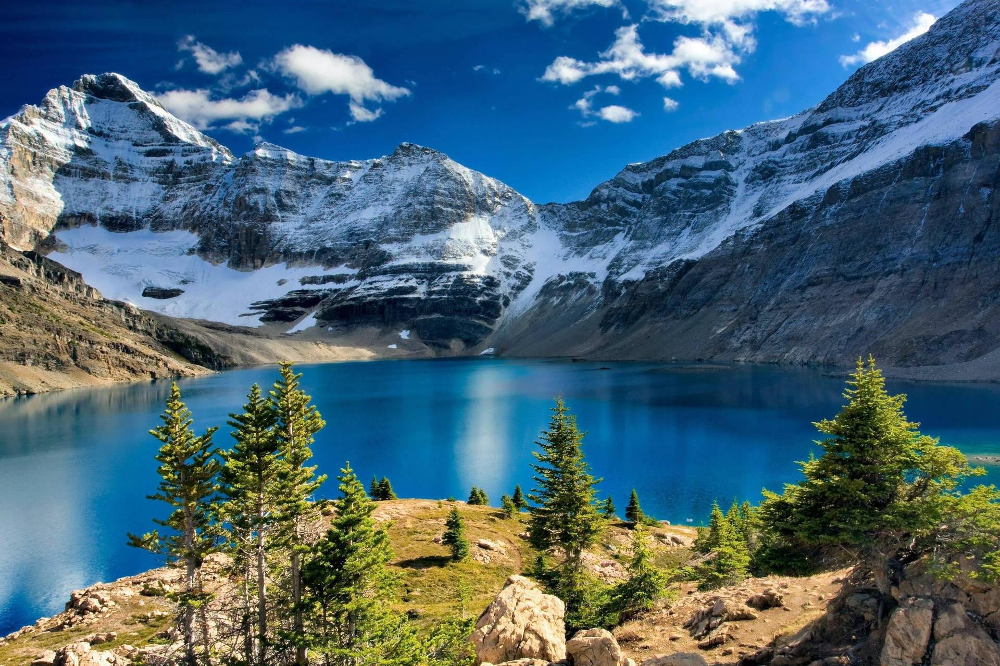

In [1]:
from PIL import Image

img_pil = Image.open('data/imgsaved.jpeg')

print(type(img_pil), img_pil.format, img_pil.size, img_pil.mode)

img_pil

### <center><a>cv2</a>

In [2]:
import cv2

img_cv = cv2.imread('data/imgsaved.jpeg')
print(type(img_cv), img_cv.shape)

cv2.imshow('Image', img_cv)
cv2.waitKey(0)
cv2.destroyAllWindows()

<class 'numpy.ndarray'> (1279, 1920, 3)


### <center><a>torchvision</a>

torch.Size([3, 1279, 1920])


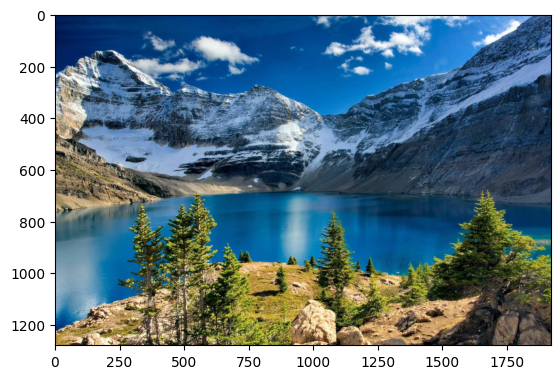

In [3]:
import matplotlib.pyplot as plt
from torchvision.io import read_image

img_t = read_image('data/imgsaved.jpeg')
print(img_t.shape)

plt.imshow(img_t.permute(1,2,0));

### <center><a>skimage</a>

<class 'numpy.ndarray'> (1279, 1920, 3)


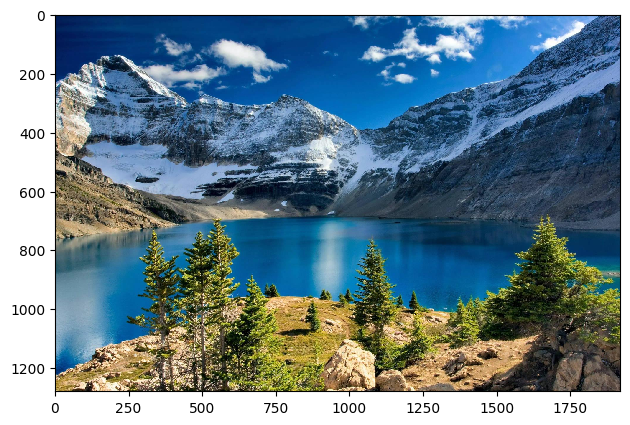

In [4]:
from skimage import io

img_sk = io.imread('data/imgsaved.jpeg')
print(type(img_sk), img_sk.shape)
io.imshow(img_sk);

___
## <center><a id=2>Изменение фона</a>

Этапы:
1. Трансформированяие из RGB в HSV
2. Гистограмма цветов
3. Выбор пикселей, не относящихся к самому частому цвету - маска
4. Бинарное закрытие дырок изображения
5. Изменение разрешения фонового изображения
6. Маска + исходное изображение
7. Маска + исходное изображение + фон

`int -> float`

(0.0, 1.0)

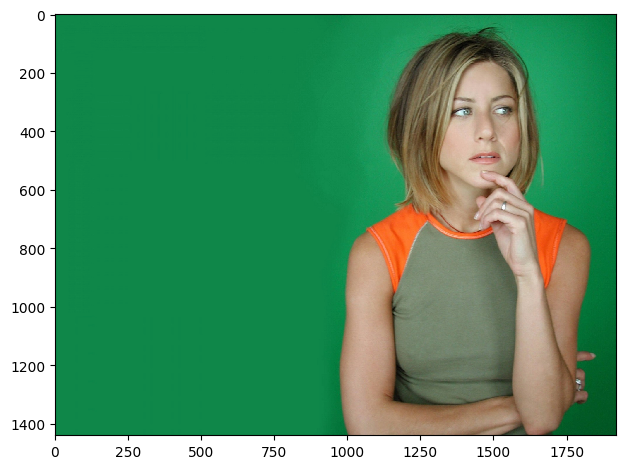

In [61]:
from skimage import transform, img_as_float, color

img = io.imread('data/green.jpg')
img = img_as_float(img)
io.imshow(img)
img.min(), img.max()

`RGB -> HSV`
-  0 канал отвечает за hue компонент (цветовые значения)

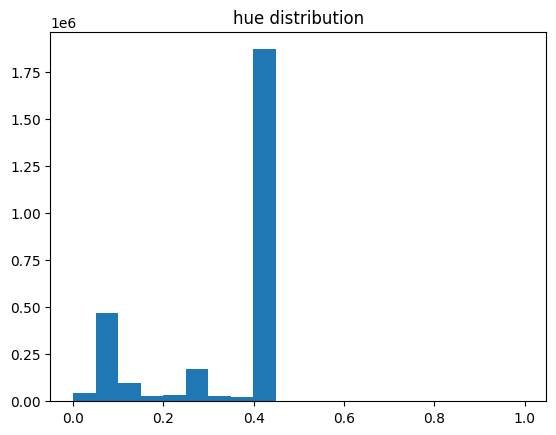

In [62]:
import matplotlib.pyplot as plt

hsv_img = color.rgb2hsv(img)
plt.hist(hsv_img[..., 0].reshape(-1), bins=20)
plt.title('hue distribution');

Все, кроме самого частого цвета

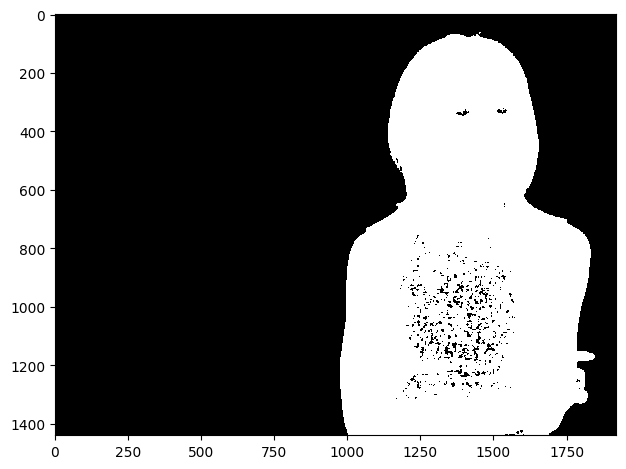

In [72]:
mask = (hsv_img[..., 0] < 0.3) | (hsv_img[..., 0] > 0.5)
io.imshow(mask);

Закрытие дырок

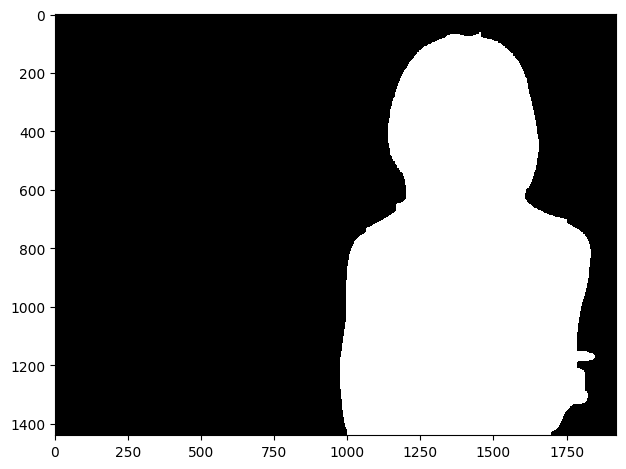

In [73]:
from skimage import morphology
import numpy as np

closed_mask = morphology.binary_closing(mask, footprint=np.ones((20,20)))
io.imshow(closed_mask);

Размер фонового изображения -> размер основного изображения

In [65]:
background = io.imread('data/imgsaved.jpeg')
print(background.shape, img.shape)
background = transform.resize(background, img.shape)

(1279, 1920, 3) (1440, 1920, 3)


Исходное изображнеие + маска

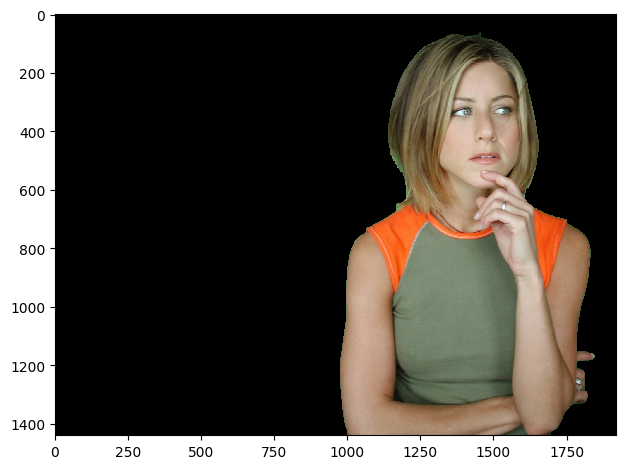

In [66]:
black_back = img * closed_mask[..., None]
io.imshow(black_back);

Фоновое изображение + исходное изображнеие + маскаска

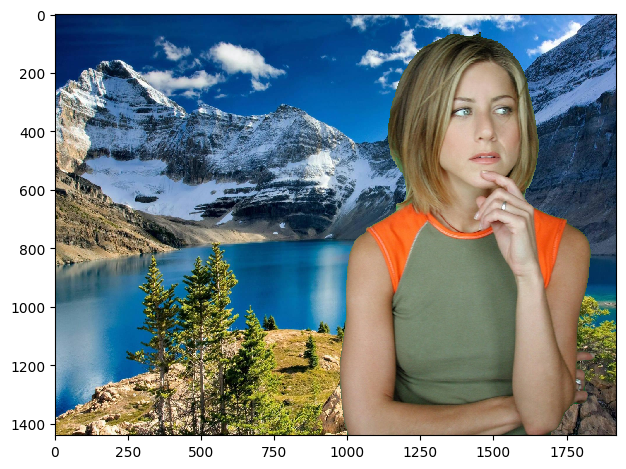

In [67]:
changed_back = black_back + background * (1 - closed_mask[..., None])
io.imshow(changed_back);

___
## <center><a>Свёртки</a>

`Сглаживание изображения сверткой (1 канал)`

In [123]:
from scipy.signal import convolve2d

kernel = np.ones((10,10))
kernel /= kernel.sum()
kernel[1]

array([0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01])

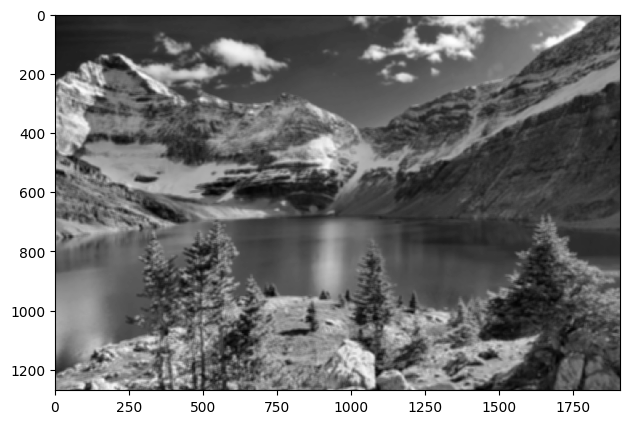

In [124]:
img_grey = color.rgb2gray(img_sk)
convolved = convolve2d(img_grey, kernel, mode='valid')

io.imshow(convolved);

`Сглаживание изображения сверткой (3 канала)`

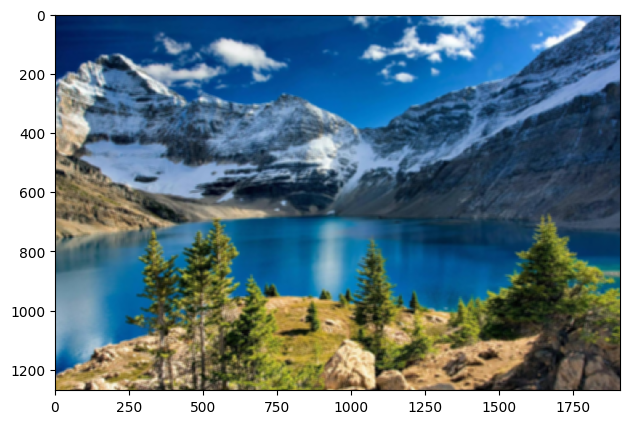

In [142]:
img_sk = img_as_float(img_sk)
conv_color = np.concatenate(
[convolve2d(img_sk[..., i], kernel, mode='valid')[...,None] for i in range(3)],-1)

io.imshow(conv_color);

`Сглаживание изображения Гауссовским фильтром`

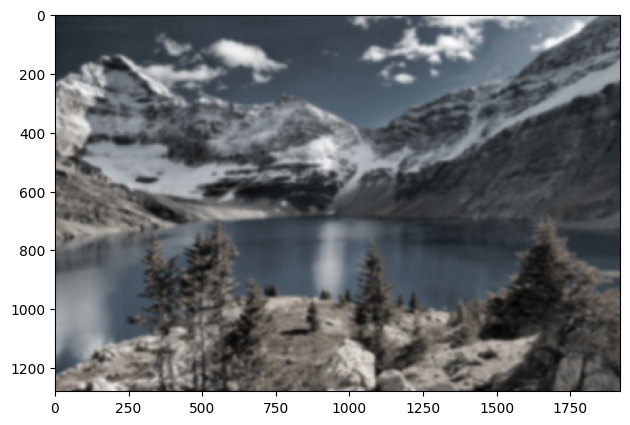

In [148]:
from skimage import filters

img_gauss = filters.gaussian(img_sk, sigma=5)
io.imshow(img_gauss)

___
## <center><a id=3>Гистограммы</a>

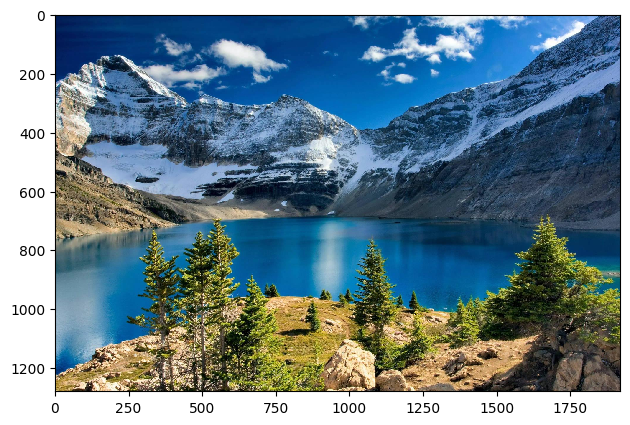

In [173]:
img = io.imread('data/imgsaved.jpeg')
io.imshow(img);

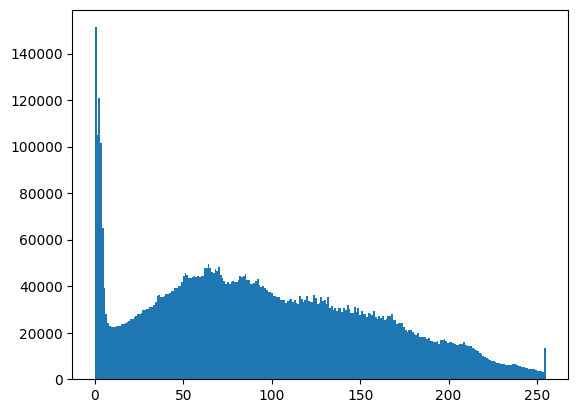

In [174]:
plt.hist(img.ravel(), bins=256);

`Увеличение контраста`

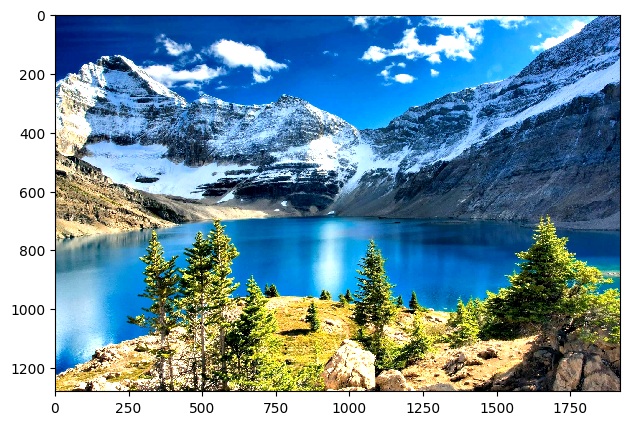

In [176]:
from skimage import exposure

perc10, perc90 = np.percentile(img, (10, 90))
rescaled = exposure.rescale_intensity(img, in_range=(perc10, perc90))
io.imshow(rescaled);


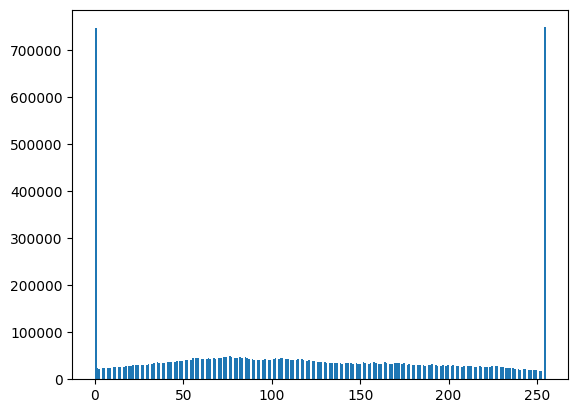

In [177]:
plt.hist(rescaled.ravel(), bins=256);

`Выравнивание гистограмм`

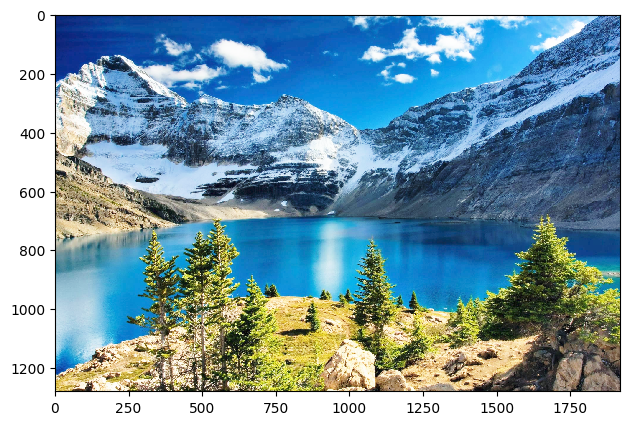

In [171]:
equalized_img = exposure.equalize_hist(img)
io.imshow(equalized_img)

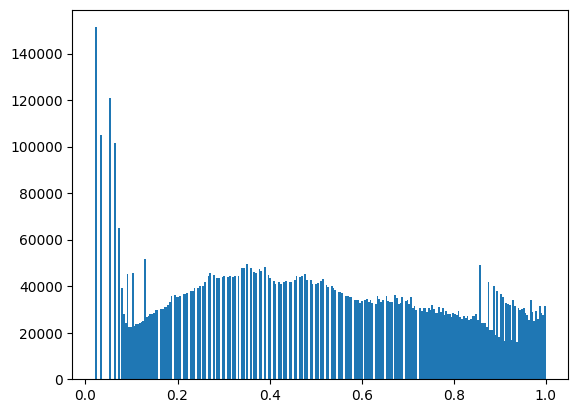

In [172]:
plt.hist(equalized_img.ravel(), bins=256);

`Адаптивное выравнивание гистограмм`

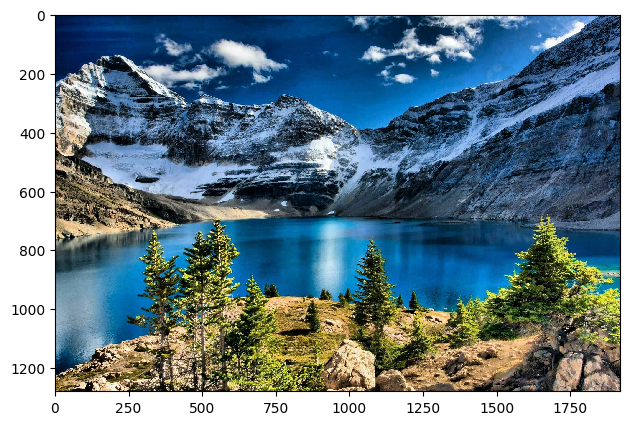

In [180]:
equalized_adatpt_img = exposure.equalize_adapthist(img)
io.imshow(equalized_adatpt_img);

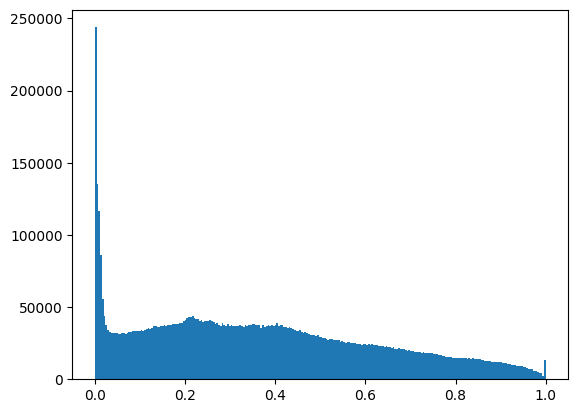

In [181]:
plt.hist(equalized_adatpt_img.ravel(), bins=256);

___
## <center><a id=4>Поиск границ</a>

### <center><a>Canny</a>

In [5]:
import cv2
import matplotlib.pyplot as plt

img = cv2.imread('data/cards.jpg')

`Изменение размера`

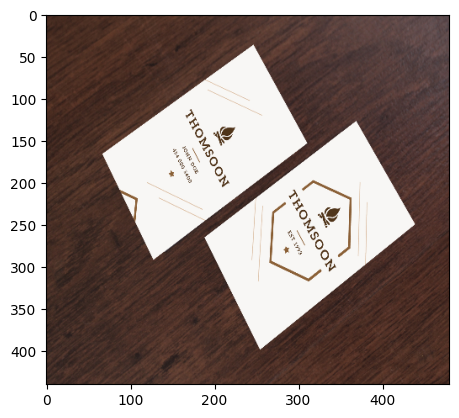

In [6]:
img = cv2.resize(img, (480, 440))
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB));

`В серый цвет`

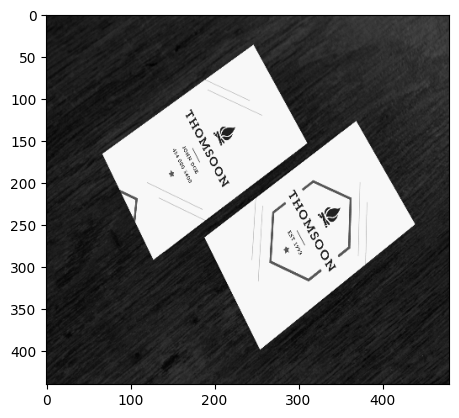

In [7]:
img_grey = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
plt.imshow(img_grey, cmap='gray');

`Сглаживание Гауссовским фильтром`

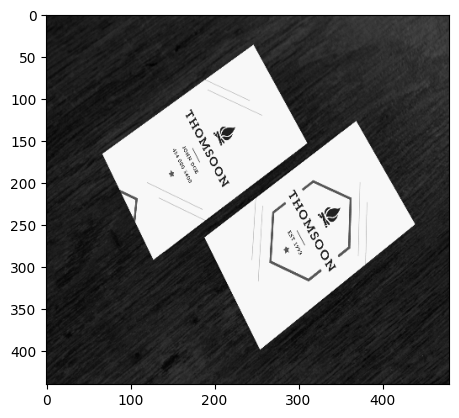

In [8]:
img_grey_blr = cv2.GaussianBlur(img_grey, (5,5), 0.1)
plt.imshow(img_grey_blr, cmap='gray');


`Выделение границ при помощи Canny`

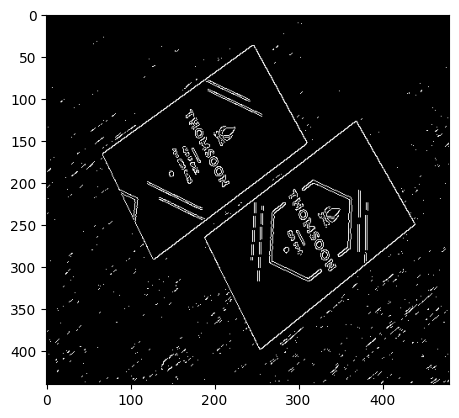

In [9]:
img_grey_blr_edge = cv2.Canny(img_grey_blr, threshold1=100, threshold2=100)
plt.imshow(img_grey_blr_edge, cmap='gray');


`Поиск контуров`

In [10]:
cntrs = cv2.findContours(img_grey_blr_edge.copy(), cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)[0]
cntrs[1]

array([[[318, 438]]], dtype=int32)

`Сортировка контуров по площади`

In [11]:
cntrs = sorted(cntrs, key=cv2.contourArea, reverse=True)

`Поиск четырехугольника`

In [12]:
solution = []
for c in cntrs:
    # считаем пермиметр чтобы задать погрешность
    peri = cv2.arcLength(c, True)
    # считаем аппроксимацию
    approx = cv2.approxPolyDP(c, 0.01 * peri, True)
    if len(approx) == 4:
        solution.append(approx)

solution = sorted(solution, key=cv2.contourArea, reverse=True)

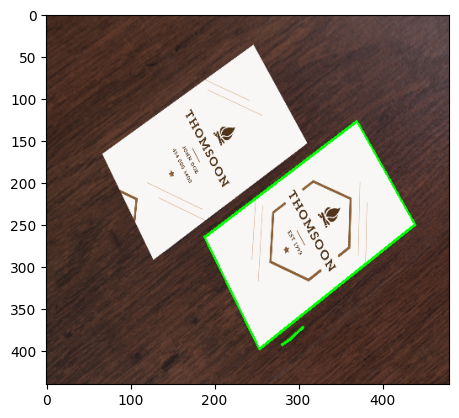

In [13]:
orig_img = img.copy()
cv2.drawContours(orig_img, [solution[0], solution[2]], -1, (0, 255, 0), 2)
plt.imshow(cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB));

___
## <center><a id=5>Билатеральный фильтр</a>

- Проверка соответствия размеров изображения и гида

In [2]:
import numpy as np


def check_images(image: np.ndarray, guide: np.ndarray) -> bool:
    if (image.shape[0], image.shape[1]) == (guide.shape[0], guide.shape[1]):
        return True
    else:
        return False

- Функция паддинга

In [30]:
def pad_image(image,
              pad_size, # Размер отступа
              mode='symmetric' # Передается в np.pad
             ) -> np.array:
    H, W = image.shape[:2]
    if image.ndim == 3:
        return np.pad(image, [(pad_size, pad_size), (pad_size, pad_size), (0, 0)], mode=mode)
    else:
        return np.pad(image, [(pad_size, pad_size), (pad_size, pad_size)], mode=mode)


- Функция, создающая ядро, основанное на расстоянии пикселей.

In [25]:
def get_distance_kernel(kernel_size, sigma) -> np.array:
    x, y = np.meshgrid(np.arange(kernel_size) - kernel_size//2, np.arange(kernel_size) - kernel_size//2)
    distance_kernel = np.exp(-(x * x + y * y) / (2 * sigma * sigma))
    return distance_kernel

get_distance_kernel(3, 1)

array([[0.36787944, 0.60653066, 0.36787944],
       [0.60653066, 1.        , 0.60653066],
       [0.36787944, 0.60653066, 0.36787944]])

- Функция, создающая ядро, основанное на разнице в яркости пикселей

In [32]:
# @numba.jit(nopython=True, parallel=True)
def get_intencity_kernel(pixel_value, # Значения центрального (референсного) пикселя
                         image_slice, # Срез картинки размером с ядро вокруг референсного пикселя
                         sigma
                        ) -> np.array:
    diff_matrix = image_slice - pixel_value
    if image_slice.ndim == 3:
        diff_matrix = np.sqrt((diff_matrix**2).sum(-1))
    return np.exp(-diff_matrix / (2 * sigma**2))

Наконец, создадим основной проход по изображению. Тут нам необходимо:

1. Создать ядро для каждого пикселя
2. Свернуть всех соседей полученным ядром
3. Привести значение пикселей на отрезок [0, 1] (Гарантируем вход такого формата далее)

In [48]:
from tqdm import trange


def main_loop(padded_image,
              padded_guide,
              distance_kernel,
              sigma_r,
              pad_size,
              kernel_size,
              output # Сюда будет записывать результат
             ) -> np.array:

    for i in trange(output.shape[0]):
        for j in range(output.shape[1]):
            padded_i = i + pad_size
            padded_j = j + pad_size

            intencity_kernel = get_intencity_kernel(padded_guide[padded_i, padded_j],
                                                    padded_guide[i:i+kernel_size, j:j+kernel_size],
                                                    sigma_r
                                                   )
            pixel_kernel = intencity_kernel * distance_kernel
            pixel_kernel /= pixel_kernel.sum()

            if padded_image.ndim == 3:
                pixel_kernel = np.expand_dims(pixel_kernel, -1)
                if padded_image.shape[-1] != 1:
                    pixel_kernel = np.concatenate((pixel_kernel,pixel_kernel, pixel_kernel), -1)
            if padded_image.ndim == 2:
                output[i, j] = (padded_image[i:i+kernel_size, j:j+kernel_size] * pixel_kernel).sum()
            else:
                output[i, j] = (padded_image[i:i+kernel_size, j:j+kernel_size] * pixel_kernel).sum(0).sum(0)
    return np.clip(output, 0, 1)

- Билатеральный фильтр

In [45]:
from skimage import img_as_float

def bilateralfilter(image,
                    guide,
                    sigma_s, # Сигма для ядра на основе расстояний
                    sigma_r # Сигма для ядра на основе яркостей
                   ) -> np.array:
    # Первым делом надо привести изображения в формат float
    image = img_as_float(image)
    guide = img_as_float(guide)

    # Затем проверяем валидность изображений
    if not check_images(image, guide):
        raise Exeption('Guidance not aligned with image')

   # Рассчитываем размер ядра и паддинга, исходя из соображений, что для гауссова ядра нужен размер 6*sigma
    pad_size = int(np.ceil(3 * sigma_s))
    kernel_size = 2 * pad_size + 1


    padded_image = pad_image(image, pad_size)
    padded_guide = pad_image(guide, pad_size)

    # Предподсчитываем ядро на основе расстояний

    distance_kernel = get_distance_kernel(kernel_size, sigma_s)

    # Запускаем основной расчет
    output = np.zeros_like(image)
    output = main_loop(padded_image, padded_guide, distance_kernel, sigma_r, pad_size, kernel_size, output)
    return output

- Реализация фильтра на изображении

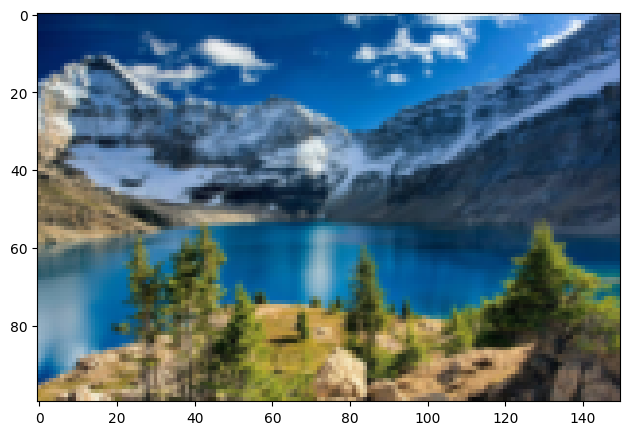

In [52]:
from skimage import io, transform

img = io.imread('data/imgsaved.jpeg')
img = transform.resize(img, [100, 150])
io.imshow(img);

In [53]:
img_filtered = bilateralfilter(img, img, 50, 50/255)

100%|██████████| 100/100 [01:14<00:00,  1.34it/s]


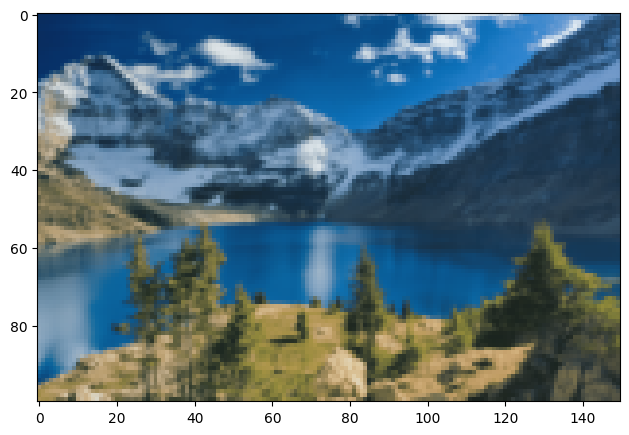

In [54]:
io.imshow(img_filtered)

___
### <center><a id=6>SKIMAGE</a>

___
### <center><a>Цвет</a>

- <a>rgb2hsv</a>
    - `Hue`: угол, для изменения цвета
    - `Saturation`: растояние, для изменения насыщенности
    - `Value`: расстояние, для изменения освещенности

- <a>rgb2gray</a> : оставляет один канал, характеризующий яркость кажого пикселя

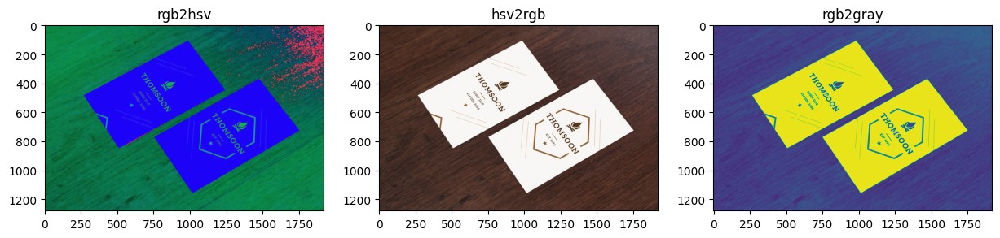

In [15]:
from skimage import color, io

img_path = 'data/cards.jpg'
img = io.imread(img_path)
fig, ax = plt.subplots(1, 3, figsize=(15,10))

img_hsv = color.rgb2hsv(img)
ax[0].imshow(img_hsv)
ax[0].set_title('rgb2hsv')

img_rgb = color.hsv2rgb(img_hsv)
ax[1].imshow(img_rgb)
ax[1].set_title('hsv2rgb')

img_gray = color.rgb2gray(img)
ax[2].imshow(img_gray)
ax[2].set_title('rgb2gray');


___
### <center><a>Уменьшение шума</a>

- <a>gaussian</a> : Фильтр Гаусса, уменьшает гауссовский шум
- <a>median</a> : медианный фильтр, уменьшает высокочастотный шум
- <a>denoise_bilateral</a> : билатеральный фильтр, уменьшает влияние шума для усреднения

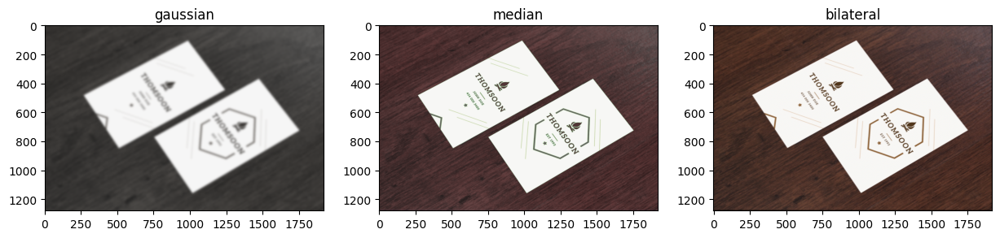

In [31]:
from skimage import filters, io, restoration
import matplotlib.pyplot as plt

img_path = 'data/cards.jpg'
img = io.imread(img_path)
fig, ax = plt.subplots(1, 3, figsize=(15,10))


img_gauss = filters.gaussian(img, sigma=7)
ax[0].imshow(img_gauss)
ax[0].set_title('gaussian')

img_median = filters.median(img, mode='constant', cval=100)
ax[1].imshow(img_median)
ax[1].set_title('median')

img_median = restoration.denoise_bilateral(img, channel_axis=-1)
ax[2].imshow(img_median)
ax[2].set_title('bilateral');

___
### <center><a>Границы изображения</a>

- <a>sobel</a> : Оператор Собеля, возвращает градиент и длинну градиента(магнитуда)
- <a>canny</a> : пайплайн для определения границ:
    - Фильтр Гаусса
    - Фильтр Собеля
    - Подавление немаксимумов
    - Фильтрация границ
    - Объединений в линии
- <a>difference_of_gaussians</a> : вычисляет разницу между примененными фильтрами Гаусса
- <a>corner_harris</a> : по градиентам определяет угловые точки изображения



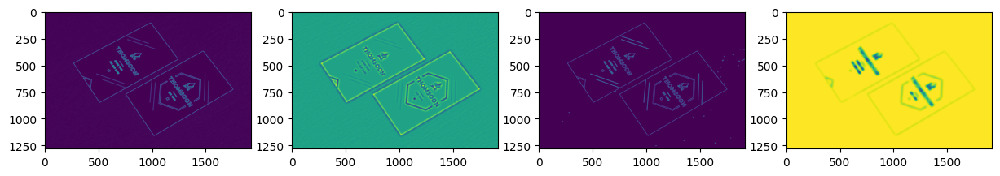

In [41]:
from skimage import filters, io, feature
import matplotlib.pyplot as plt


img_path = 'data/cards.jpg'
img = io.imread(img_path)[:,:,2]
fig, ax = plt.subplots(1, 4, figsize=(15,10))

img_sobel = filters.sobel(img)
ax[0].imshow(img_sobel)

img_dog = filters.difference_of_gaussians(img, low_sigma=5)
ax[1].imshow(img_dog)

img_canny = feature.canny(img)
ax[2].imshow(img_canny)

img_harris = feature.corner_harris(img, sigma=10, k=0.7)
ax[3].imshow(img_harris)


___
### <center><a>Пирамиды изображений</a>

- <a>pyramid_gaussian</a> : набор изображений, уменьшенных в 2 раза на каждом шаге
    - Resize
    - Фильтр Гаусса


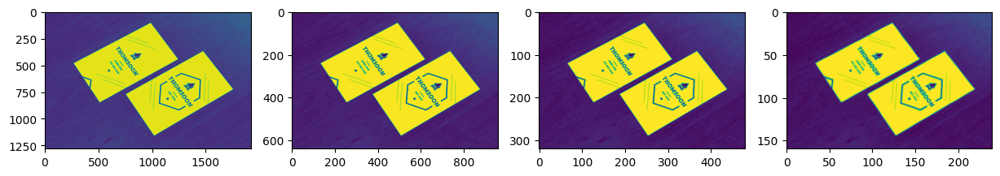

In [1]:
from skimage import io, transform
import matplotlib.pyplot as plt


img_path = 'data/cards.jpg'
img = io.imread(img_path)[:,:,2]

fig, ax = plt.subplots(1, 4, figsize=(15,10))
img_pyr = transform.pyramid_gaussian(img)
i = next(img_pyr)
ax[0].imshow(i)
i = next(img_pyr)
ax[1].imshow(i)
i = next(img_pyr)
ax[2].imshow(i);
i = next(img_pyr)
ax[3].imshow(i);

- <a>pyramid_laplacian</a> : набор изображений, как разница между изображением гауссовской пирамидой и сглаженным изображением

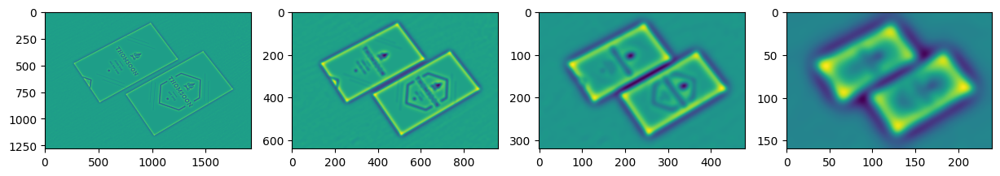

In [2]:
from skimage import io, transform
import matplotlib.pyplot as plt


img_path = 'data/cards.jpg'
img = io.imread(img_path)[:,:,2]

fig, ax = plt.subplots(1, 4, figsize=(15,10))
img_pyr = transform.pyramid_laplacian(img, sigma=10)
i = next(img_pyr)
ax[0].imshow(i)
i = next(img_pyr)
ax[1].imshow(i)
i = next(img_pyr)
ax[2].imshow(i);
i = next(img_pyr)
ax[3].imshow(i);

___
### <center><a>Дескрипторы</a>

- <a>hog</a> : (гистограмма ориентированных градиентов), вектор признаков, характеризующий схожесть изображений

<img src='data/hog.png'>


In [46]:
from skimage import feature


hog_size = feature.hog(img).shape
hog_emb = feature.hog(img)
print(f'Вектор {hog_emb}, размером {hog_size}')

Вектор [0.20578012 0.16634239 0.01569591 ... 0.03347848 0.0477162  0.02020563], размером (3045924,)


- <a>SIFT</a> : матрица признаков, характеризующая схожесть изображений, на которую не влияет освещение и разрешение изображения

<img src='data/sift.png'>

In [60]:
from skimage import feature

descriptor = feature.SIFT()
descriptor.detect_and_extract(img)
sift_emb = descriptor.descriptors
print(f'Матрица:\n {sift_emb[:5,:5]}, размером {sift_emb.shape}')


Матрица:
 [[ 77   0   0   0   0]
 [  2 114   6   0   0]
 [ 15   0   0  25 156]
 [  0   0   0  60 123]
 [  0   0   0   4  44]], размером (1188, 128)
